In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

print(tf.__version__)

2.3.1


In [9]:
# Import the data from the old carbon emissions dataset
data = "https://raw.githubusercontent.com/Blackman9t/Machine_Learning/master/Original_2000_2014_Fuel_Consumption_Ratings.csv"
missing_data = ["n/a","na","--","?","non","Non","None"]

df = pd.read_csv(data, na_values=missing_data)

df.rename(columns={'FUEL_CONSUMPTION_CITY(L/100km)':'FUEL_CONS_CITY', 
                        'ENGINE_SIZE(L)':'ENGINE_SIZE',
                       'HWY_(L/100km)':'HWY_L100km',
                       'COMB_(L/100km)':'COMB_L100km',
                       'COMB_(mpg)':'COMB_MPG',
                       'CO2_EMISSIONS(g/km)':'CO2_EMISSIONS'},
                       inplace=True)
target = df["CO2_EMISSIONS"]
df.head()

,MODEL_YEAR,MAKE,MODEL,VEHICLE_CLASS,ENGINE_SIZE,CYLINDERS,TRANSMISSION,FUEL_TYPE,FUEL_CONS_CITY,HWY_L100km,COMB_L100km,COMB_MPG,CO2_EMISSIONS
0,2000,ACURA,1.6EL,COMPACT,1.6,4,A4,X,9.2,6.7,8.1,35,186
1,2000,ACURA,1.6EL,COMPACT,1.6,4,M5,X,8.5,6.5,7.6,37,175
2,2000,ACURA,3.2TL,MID-SIZE,3.2,6,AS5,Z,12.2,7.4,10.0,28,230
3,2000,ACURA,3.5RL,MID-SIZE,3.5,6,A4,Z,13.4,9.2,11.5,25,264
4,2000,ACURA,INTEGRA,SUBCOMPACT,1.8,4,A4,X,10.0,7.0,8.6,33,198


In [15]:
# Drop the non correlated columns as found before. This means no one-hot encoding is needed. 
cols_needed = ['ENGINE_SIZE','CYLINDERS','COMB_MPG',"CO2_EMISSIONS"]
df = df[cols_needed]
df.head()

,ENGINE_SIZE,CYLINDERS,COMB_MPG,CO2_EMISSIONS
0,1.6,4,35,186
1,1.6,4,37,175
2,3.2,6,28,230
3,3.5,6,25,264
4,1.8,4,33,198


In [14]:
# Split into test and train. Could do this with scikit-learn but will follow tensorflow tutorial for now. 
train_dataset = df.sample(frac=0.8, random_state=0)
test_dataset = df.drop(train_dataset.index)

# Check the lengths of the two sets
print(f"""
Total dataset size: {len(df)}
Total train size: {len(train_dataset)}
Total test size: {len(test_dataset)}
Test + train: {len(train_dataset) + len(test_dataset)}
""")


Total dataset size: 14343
Total train size: 11474
Total test size: 2869
Test + train: 14343



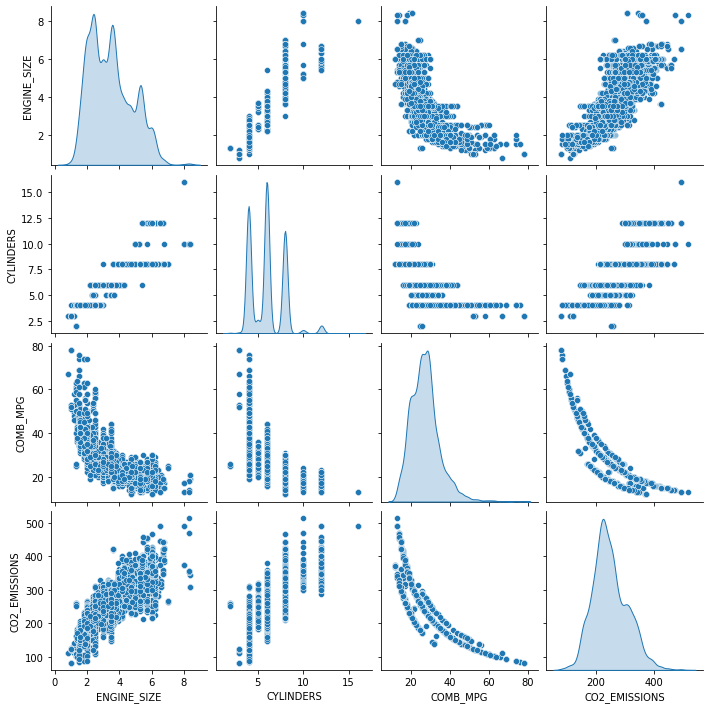

In [16]:
sns.pairplot(train_dataset[cols_needed], diag_kind='kde')

### First a linear model using keras (this should be similar to OLS and RF)

In [20]:
# Split the data into labels and features (targets and inputs)
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('CO2_EMISSIONS')
test_labels = test_features.pop('CO2_EMISSIONS')

In [21]:
train_dataset.describe().transpose()[['mean', 'std']]

,mean,std
ENGINE_SIZE,3.465644,1.311384
CYLINDERS,5.982744,1.775576
COMB_MPG,27.409970,7.584059
CO2_EMISSIONS,248.065539,59.136288


### Normalization 

It is good practice to normalize features that use different scales and ranges.

One reason this is important is because the features are multiplied by the model weights. So the scale of the outputs and the scale of the gradients are affected by the scale of the inputs.

Although a model might converge without feature normalization, normalization makes training much more stable.

In [23]:
# Simple built in normalizer
normalizer = preprocessing.Normalization()

# Adapt it to the data (This calculates the mean and variance, and stores them in the layer.)
normalizer.adapt(np.array(train_features))

print(normalizer.mean.numpy())


[ 3.466  5.983 27.41 ]


In [25]:
# Lets inspect the normalized data. By looking at the first layer. 
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[ 5.3  8.  22. ]]

Normalized: [[ 1.4   1.14 -0.71]]


In [35]:
# Define a loss plotting function for later use.
def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.xlabel('Epoch')
  plt.ylabel('Error')
  plt.legend()
  plt.grid(True)

In [27]:
# Multiple input linear model
linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])


In [28]:
linear_model.predict(train_features[:10])

array([[-1.752],
       [ 1.263],
       [ 0.506],
       [ 1.291],
       [ 1.604],
       [ 1.759],
       [ 0.9  ],
       [-0.238],
       [-1.213],
       [-2.245]], dtype=float32)

In [29]:
linear_model.layers[1].kernel

<tf.Variable 'dense/kernel:0' shape=(3, 1) dtype=float32, numpy=
array([[-0.957],
       [-0.678],
       [-0.5  ]], dtype=float32)>

In [30]:
# Compile and fit the model
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

In [31]:
%%time
history = linear_model.fit(
    train_features, train_labels, 
    epochs=100,
    # suppress logging
    verbose=0,
    # Calculate validation results on 20% of the training data
    validation_split = 0.2)

Wall time: 27.7 s


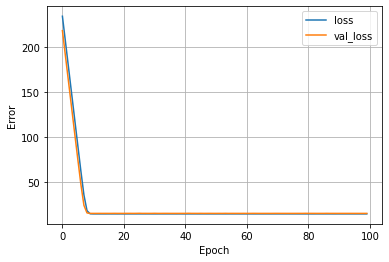

In [37]:
plot_loss(history)

In [43]:
# Collect the results for later
test_results = {}
test_results['linear_model'] = linear_model.evaluate(
    test_features, test_labels, verbose=0)
test_results

{'linear_model': 14.169837951660156}

In [44]:
linear_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_1 (Normalizati (None, 3)                 7         
_________________________________________________________________
dense (Dense)                (None, 1)                 4         
Total params: 11
Trainable params: 4
Non-trainable params: 7
_________________________________________________________________


### Dynamic Nueral Network (DNN) model

In [46]:
def build_and_compile_model(norm):
  model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
  return model

In [49]:
dnn_model = build_and_compile_model(normalizer)
dnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_1 (Normalizati (None, 3)                 7         
_________________________________________________________________
dense_4 (Dense)              (None, 64)                256       
_________________________________________________________________
dense_5 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 65        
Total params: 4,488
Trainable params: 4,481
Non-trainable params: 7
_________________________________________________________________


In [50]:
# Train the model 

In [51]:
%%time
history = dnn_model.fit(
    train_features, train_labels,
    validation_split=0.2,
    verbose=0, epochs=100)

Wall time: 32.2 s


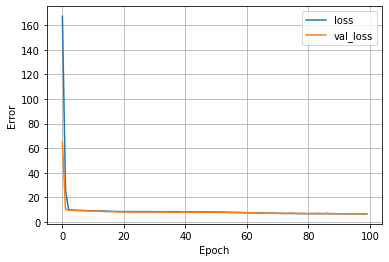

In [52]:
plot_loss(history)

In [53]:
test_results['dnn_model'] = dnn_model.evaluate(test_features, test_labels, verbose=0)

In [55]:
pd.DataFrame(test_results, index=['Mean absolute error (Emissions']).T


,Mean absolute error (Emissions)
linear_model,14.169838
dnn_model,6.127695


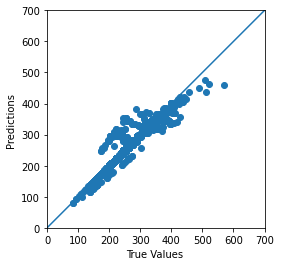

In [59]:
test_predictions = dnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values ')
plt.ylabel('Predictions ')
lims = [0, 700]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

Shows a pretty accurate prediction as it goes. 

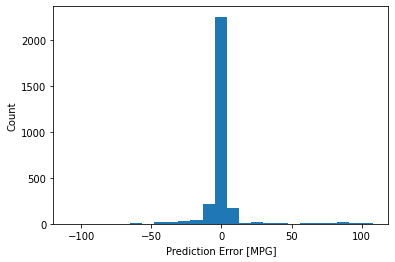

In [60]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')